# Stay Alert! The Ford Challenge

# Introduction

Driving while distracted, fatigued or drowsy may lead to accidents. Activities that divert the driver's attention from the road ahead, such as engaging in a conversation with other passengers in the car, making or receiving phone calls, sending or receiving text messages, eating while driving or events outside the car may cause driver distraction. Fatigue and drowsiness can result from driving long hours or from lack of sleep.

The objective of this challenge is to design a detector/classifier that will detect whether the driver is alert or not alert, employing any combination of vehicular, environmental and driver physiological data that are acquired while driving.

# Installation of Libraries

Let me first install all the necessary libraries for this project.

In [1]:
!pip install jovian --upgrade --quiet

In [2]:
import jovian

In [3]:
!pip install numpy pandas matplotlib seaborn --quiet

In [4]:
!pip install jovian opendatasets xgboost graphviz lightgbm scikit-learn xgboost lightgbm --upgrade --quiet

## Downloading the Data

We can download the dataset from Kaggle directly within the Jupyter notebook using the `opendatasets` library. 

I'm using a dataset that shows the result of a number of trials, each one representing about a 2 minutes of a sequential data that are recorded every 100 ms during a driving session on the road or in a driver simulator. The trials are samples from some 100 drivers of both genders, and of different ages and ethnic background.

In [5]:
import os
import opendatasets as od
import pandas as pd
# pd.set_option("display.max_columns", 120)
# pd.set_option("display.max_rows", 120)

In [10]:
od.download('https://www.kaggle.com/c/stayalert')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: edvinguromin
Your Kaggle Key: ··········


100%|██████████| 18.2M/18.2M [00:01<00:00, 13.0MB/s]



Extracting archive ./stayalert/stayalert.zip to ./stayalert


In [11]:
os.listdir('stayalert')

['example_submission.csv', 'fordTrain.csv', 'fordTest.csv', 'Solution.csv']

In [12]:
train_df = pd.read_csv('./stayalert/fordTrain.csv', low_memory=False)
solution_df = pd.read_csv('./stayalert/Solution.csv')
test_df = pd.read_csv('./stayalert/fordTest.csv')
submission_df = pd.read_csv('./stayalert/example_submission.csv')

In [13]:
train_df.head()

,TrialID,ObsNum,IsAlert,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
0,0,0,0,34.7406,9.84593,1400,42.8571,0.290601,572,104.895,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.96,0.175,752,5.99375,0,2005,0,13.4,0,4,14.8004
1,0,1,0,34.4215,13.41120,1400,42.8571,0.290601,572,104.895,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.98,0.455,752,5.99375,0,2007,0,13.4,0,4,14.7729
2,0,2,0,34.3447,15.18520,1400,42.8571,0.290601,576,104.167,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.97,0.280,752,5.99375,0,2011,0,13.4,0,4,14.7736
3,0,3,0,34.3421,8.84696,1400,42.8571,0.290601,576,104.167,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.99,0.070,752,5.99375,0,2015,0,13.4,0,4,14.7667
4,0,4,0,34.3322,14.69940,1400,42.8571,0.290601,576,104.167,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,102.07,0.175,752,5.99375,0,2017,0,13.4,0,4,14.7757


In [14]:
solution_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120840 entries, 0 to 120839
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   TrialID     120840 non-null  int64 
 1   ObsNum      120840 non-null  int64 
 2   Prediction  120840 non-null  int64 
 3   Indicator   120840 non-null  object
dtypes: int64(3), object(1)
memory usage: 3.7+ MB


In [15]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120840 entries, 0 to 120839
Data columns (total 33 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   TrialID  120840 non-null  int64  
 1   ObsNum   120840 non-null  int64  
 2   IsAlert  120840 non-null  object 
 3   P1       120840 non-null  float64
 4   P2       120840 non-null  float64
 5   P3       120840 non-null  int64  
 6   P4       120840 non-null  float64
 7   P5       120840 non-null  float64
 8   P6       120840 non-null  int64  
 9   P7       120840 non-null  float64
 10  P8       120840 non-null  int64  
 11  E1       120840 non-null  float64
 12  E2       120840 non-null  float64
 13  E3       120840 non-null  int64  
 14  E4       120840 non-null  int64  
 15  E5       120840 non-null  float64
 16  E6       120840 non-null  int64  
 17  E7       120840 non-null  int64  
 18  E8       120840 non-null  int64  
 19  E9       120840 non-null  int64  
 20  E10      120840 non-null  

# Exploratory Data Analysis and Visualization

This is the crucial steps for analysing a data. We should always visualize the data to recognize the patterns in the data to be able to decide what data should be used to train the model, and to be able to decide which type of machine learning algorithm should we use to predict the results in future.

In [17]:
!pip install plotly matplotlib seaborn --quiet

In [18]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [19]:
px.histogram(train_df,x='P1',title='Physiological-P1  vs. IsAlert',color='IsAlert')

In [20]:
px.histogram(train_df,x='V2',title='Vehicular factor(V2)  vs. Driver Alertness',color='IsAlert')

In [21]:
px.histogram(train_df,x='E9',title='Environmental factor(E9)  vs. Driver Alertness',color='IsAlert')

In [22]:
px.scatter(train_df.sample(60000), title='Physiological. vs Driver Alertness.', x='P1', y='P2',color='IsAlert')

In [23]:
px.scatter(train_df.sample(60000), title='Environment. vs Driver Alertness.', x='E1', y='E2', color='IsAlert')

#Identifying Input and Target Columns

Let's create a list of input columns, and also identify the target column.


In [24]:
#creating copy of df and move the target column to the last column in dataframe.
train_df_copy = train_df.copy()
test_df_copy = test_df.copy()
# now, moving the target col as the last col in df to make segregation easy.
train_df_copy = train_df_copy.drop(columns=['IsAlert']).assign(IsAlert=train_df_copy['IsAlert'])
test_df_copy = test_df_copy.drop(columns=['IsAlert']).assign(IsAlert=test_df_copy['IsAlert'])

In [25]:
input_cols = list(train_df_copy.columns)[2:-1]
target_col = 'IsAlert'
print('input_cols:: ', input_cols)
print('target_col:: ', target_col)

input_cols::  ['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
target_col::  IsAlert


In [26]:
inputs = train_df_copy[input_cols].copy()
targets = train_df_copy[target_col].copy()

In [27]:
!pip install numpy --quiet

In [28]:
import numpy as np

In [29]:
numeric_cols = inputs.select_dtypes(include=np.number).columns.tolist()[:]

In [30]:
inputs[numeric_cols].isna().sum()

P1     0
P2     0
P3     0
P4     0
P5     0
P6     0
P7     0
P8     0
E1     0
E2     0
E3     0
E4     0
E5     0
E6     0
E7     0
E8     0
E9     0
E10    0
E11    0
V1     0
V2     0
V3     0
V4     0
V5     0
V6     0
V7     0
V8     0
V9     0
V10    0
V11    0
dtype: int64

Since there is no missing data here, we dont need to take any extra actions on this data. But lets consider there are some missing datas, then we should impute the data in the dataframe. There are various strategies to impute a data like mean, median, etc. We can choose the strategy according to the need.

## Scaling Numeric Features

Another good practice is to scale numeric features to a small range of values e.g. $(0,1)$ or $(-1,1)$. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

The numeric columns in our dataset have varying ranges.

In [31]:
inputs[numeric_cols].describe()

,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
count,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.0,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.0,604329.000000,604329.0,604329.000000,604329.000000
mean,35.449020,11.996525,1026.671035,64.061965,0.178923,845.384610,77.887628,0.0,10.512332,102.790045,0.290565,-4.230136,0.016262,358.674738,1.757296,1.383058,0.876787,63.311256,1.315265,76.965412,-0.037710,573.786433,19.961030,0.179814,1715.688383,0.0,12.710354,0.0,3.312257,11.668277
std,7.484629,3.760292,309.277877,19.755950,0.372309,2505.335141,18.577930,0.0,14.049071,127.258629,1.006162,35.508596,0.002304,27.399973,2.854852,1.608807,0.328681,18.891029,5.247204,44.387031,0.403896,298.412888,63.269456,0.384033,618.176470,0.0,11.532085,0.0,1.243586,9.934423
min,-22.481200,-45.629200,504.000000,23.885300,0.038920,128.000000,0.262224,0.0,0.000000,0.000000,0.000000,-250.000000,0.008000,260.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4.795000,240.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,1.000000,1.676730
25%,31.758100,9.903540,792.000000,49.180300,0.092110,668.000000,66.666700,0.0,0.000000,0.000000,0.000000,-8.000000,0.015686,348.000000,0.000000,0.000000,1.000000,52.000000,0.000000,41.930000,-0.175000,255.000000,1.487500,0.000000,1259.000000,0.0,0.000000,0.0,3.000000,7.947680
50%,34.145100,11.400400,1000.000000,60.000000,0.105083,800.000000,75.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.016001,365.000000,1.000000,1.000000,1.000000,67.000000,0.000000,100.400000,0.000000,511.000000,3.018750,0.000000,1994.000000,0.0,12.800000,0.0,4.000000,10.772600
75%,37.311900,13.644200,1220.000000,75.757600,0.138814,900.000000,89.820400,0.0,28.240000,211.584000,0.000000,6.000000,0.016694,367.000000,2.000000,2.000000,1.000000,73.000000,0.000000,108.500000,0.070000,767.000000,7.481250,0.000000,2146.000000,0.0,21.900000,0.0,4.000000,15.270900
max,101.351000,71.173700,2512.000000,119.048000,27.202200,228812.000000,468.750000,0.0,243.991000,359.995000,4.000000,260.000000,0.023939,513.000000,25.000000,9.000000,1.000000,127.000000,52.400000,129.700000,3.990000,1023.000000,484.488000,1.000000,4892.000000,0.0,82.100000,0.0,7.000000,262.534000


In [32]:
from sklearn.preprocessing import MinMaxScaler

In [33]:
scaler = MinMaxScaler().fit(inputs[numeric_cols])

In [34]:
inputs[numeric_cols] = scaler.transform(inputs[numeric_cols])

## Gradient Boosting Classifier

In [35]:
from sklearn.model_selection import train_test_split
X_train, X_test, train_targets, test_targets = train_test_split(inputs, targets,train_size=0.75, test_size=0.25)

### Training

To train a GBM, we can use the `XGBRegressor` class from the [`XGBoost`](https://xgboost.readthedocs.io/en/latest/) library.

In [36]:
from xgboost.sklearn import XGBClassifier
import warnings
warnings.filterwarnings('ignore')

In [37]:
model = XGBClassifier(random_state=42, 
                           n_jobs=-1, n_estimators=20, 
                           max_depth=4, eval_metric='mlogloss')

In [38]:
%%time
model.fit(X_train,train_targets)

CPU times: user 28.3 s, sys: 61.4 ms, total: 28.4 s
Wall time: 14.7 s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=20, n_jobs=-1,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [39]:
preds = model.predict(X_test)
preds

array([1, 1, 0, ..., 0, 1, 0])

In [40]:
from sklearn.metrics import mean_squared_error
def rmse(a, b):
    return mean_squared_error(a, b, squared=False)

In [41]:
loss = rmse(preds,test_targets)
print('RMSE loss is :: ',loss)

RMSE loss is ::  0.3306017822685415


In [42]:
acc = model.score(X_test,test_targets)
print(f'Model accuracy is :: {acc * 100 : 0.2f}%')

Model accuracy is ::  89.07%


### Feature importance

Just like decision trees and random forests, XGBoost also provides a feature importance score for each column in the input.

In [43]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [44]:
importance_df.head(10)

,feature,importance
16,E9,0.332878
29,V11,0.101478
14,E7,0.066431
19,V1,0.065514
10,E3,0.060461
15,E8,0.047837
13,E6,0.039047
4,P5,0.037090
5,P6,0.034567
9,E2,0.034038


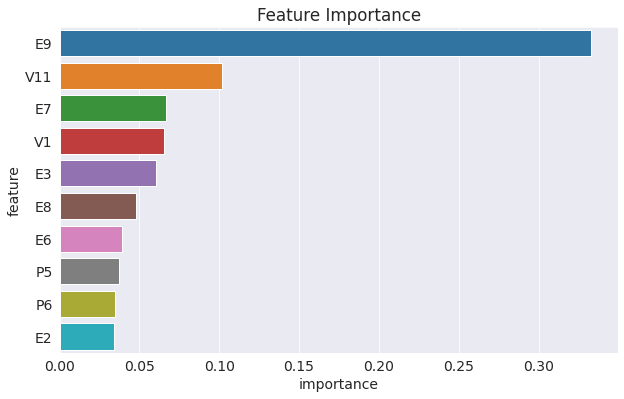

In [45]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

## Hyperparameter Tuning and Regularization


In [46]:
model

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=20, n_jobs=-1,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

Here's a helper function to test hyperparameters with K-fold cross validation.

In [47]:
X_val, val_targets = X_test, test_targets

In [48]:
def test_params(**params):
    model = XGBClassifier(random_state=42,eval_metric='mlogloss', **params)
    model.fit(X_train, train_targets)
    train_rmse = rmse(model.predict(X_train), train_targets)
    val_rmse = rmse(model.predict(X_val), val_targets)
    print('Train RMSE: {}, Validation RMSE: {}'.format(train_rmse, val_rmse))

#### `n_estimators`

The number of trees to be created. More trees = greater capacity of the model.


In [49]:
test_params(n_estimators=10)

Train RMSE: 0.317273974256364, Validation RMSE: 0.317811396661528


In [50]:
test_params(n_estimators=15)

Train RMSE: 0.30115190791014174, Validation RMSE: 0.30248863535014753


In [51]:
test_params(n_estimators=20)

Train RMSE: 0.2854142279417502, Validation RMSE: 0.2870627730003666


#### `max_depth`

As you increase the max depth of each tree, the capacity of the tree increases and it can capture more information about the training set.

In [52]:
test_params(max_depth=3)

Train RMSE: 0.2960499301303057, Validation RMSE: 0.29772473706826863


In [53]:
test_params(max_depth=4)

Train RMSE: 0.26199739610644546, Validation RMSE: 0.2640390990311848


#### `learning_rate`

The scaling factor to be applied to the prediction of each tree. A very high learning rate (close to 1) will lead to overfitting, and a low learning rate (close to 0) will lead to underfitting.

In [54]:
test_params(n_estimators=10, learning_rate=0.01)

Train RMSE: 0.3639961146477021, Validation RMSE: 0.36415549980772816


#### `booster`

Instead of using Decision Trees, XGBoost can also train a linear model for each iteration. This can be configured using `booster`.

In [55]:
test_params(booster='gblinear')

Train RMSE: 0.46315272044206357, Validation RMSE: 0.46107673352852346


## Putting it Together and Making Predictions

Let's train a final model on the entire training set with custom hyperparameters. 

In [56]:
#Perform House cleaning and delete previously used model object
del model

In [57]:
model = XGBClassifier(random_state=42,n_jobs=-1, 
                      n_estimators=50,max_depth=13, 
                      eval_metric='mlogloss')

In [58]:
%%time
model.fit(X_train,train_targets)

CPU times: user 4min 31s, sys: 712 ms, total: 4min 32s
Wall time: 2min 21s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=13, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=50, n_jobs=-1,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [59]:
test_preds = model.predict(X_test)
print(f'Training accuracy is : {model.score(X_train,train_targets) * 100 :0.2f}%')
print(f'Testing accuracy is : {model.score(X_val,val_targets) * 100 :0.2f}%')

Training accuracy is : 99.54%
Testing accuracy is : 98.70%


In [60]:
solution_df['IsAlert']  = test_preds[:120840]

In [61]:
solution_df.to_csv('submission.csv', index=None)

## Saving and Loading Trained Models

We can use the `joblib` module to save and load Python objects on the disk. 

In [62]:
def predict_input(model, single_input):
    X_input = pd.DataFrame([single_input])    
    pred = model.predict(X_input)[0]    
    return 'Alert' if pred == 1 else 'Not Alert'

In [63]:
new_input = {
              'P1':53.9192, 
              'P2':7.70628, 
              'P3':800, 
              'P4':75.0,
              'P5':0.259465, 
              'P6':1124,
              'P7':53.3808, 
              'P8':0, 
              'E1':0.0, 
              'E2':0.0, 
              'E3':0, 
              'E4':0, 
              'E5':0.014174, 
              'E6':367, 
              'E7':0, 
              'E8':0, 
              'E9':1, 
              'E10':31,
              'E11':0.0,
              'V1':0.0, 
              'V2':-0.56, 
              'V3':752, 
              'V4':17.9812, 
              'V5':0, 
              'V6':648, 
              'V7':0, 
              'V8':0.0, 
              'V9':0, 
              'V10':1,
              'V11':14.3835                
            }

In [64]:
pred = predict_input(model, new_input)
print('Prediction for single input is : {}'.format(pred))

Prediction for single input is : Alert


In [65]:
import joblib
from sklearn.metrics import accuracy_score, confusion_matrix

In [66]:
driver_alert = {
    'model': model,    
    'scaler': scaler,    
    'input_cols': input_cols,
    'target_col': target_col,
    'numeric_cols': numeric_cols    
}

In [67]:
joblib.dump(driver_alert, 'driver_alert.joblib')

['driver_alert.joblib']

In [68]:
driver_alert_02 = joblib.load('driver_alert.joblib')

In [69]:
test_preds2 = driver_alert_02['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)
print(f'Test Accuracy for Single Input : {accuracy_score(test_targets, test_preds2) * 100 :0.2f}%')

Test Accuracy for Single Input : 98.70%


## Summary and References

The following topics were covered in this real word project:

- Downloading a real-world dataset
- Preparing a dataset for training
- Training and interpreting decision trees
- Training and interpreting random forests
- Overfitting, hyperparameter tuning & regularization
- Making predictions on single inputs



Following concepts were also covered the following terms:

* XGBClassifier
* Overfitting
* Hyperparameter
* Hyperparameter tuning
* Regularization
* Ensembling
* Generalization


